In [1]:
import scanpy as sc
sc.settings.verbosity = 2

import pandas as pd

import tqdm.notebook

import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns 

import torch
import pyro

In [2]:
import decipher as dc

In [3]:
import warnings
warnings.filterwarnings("ignore")

In [306]:
adata_orig = sc.read_h5ad("PDAC_cassandra/GSE207938_ProgressionCohort.h5ad")

Cluster Annotations:

7: ADM in normal (branch 1), stress

12: ADM in normal (branch 2)

3: ADM in Kras mutant mice

14: Acinar-PDAC "bridge" (mutant mice, day 2)

In [226]:
clusters_keep = [3,7,12]
adata = adata[[cluster in clusters_keep for cluster in adata.obs['cluster']],:]
adata.obs['Cluster'] = adata.obs['cluster'].values.astype(str)
del adata.obs['cluster']

In [227]:


#Decipher method takes raw expression values
adata.X = adata.raw.X

In [228]:
config = dc.tl.DecipherConfig(
    dim_z=10,
    dim_v=2,
    seed=0,
    beta=1e-1
)

Epoch 39 (batch 61/61) | | train elbo: 6209.78 (last epoch: 6225.48) | val ll: 6513.88:   4%|  | 39/1000 [04:28<1:50:22,  6.89s/it]2024-10-02 14:24:47,345 | INFO : Early stopping has been triggered.
2024-10-02 14:24:47,571 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2024-10-02 14:24:47,572 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.
2024-10-02 14:24:47,578 | INFO : Saving decipher model with run_id 2024-10-02-14-24-47-organic-cross-range.


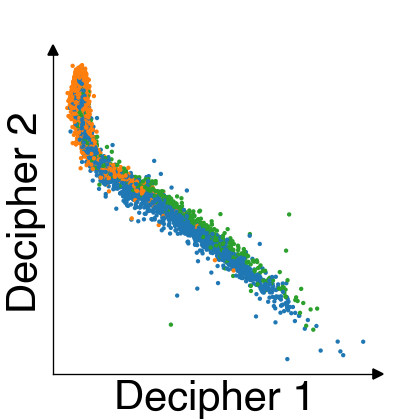

... storing 'Cluster' as categorical


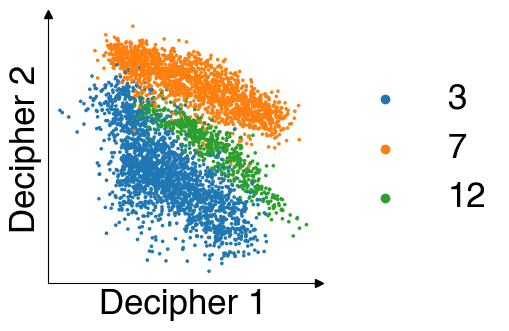

In [229]:
d1, val1 = dc.tl.decipher_train(
    adata, config, plot_kwargs={"color": "Cluster"}, plot_every_k_epochs=5,
)

... storing 'Cluster' as categorical


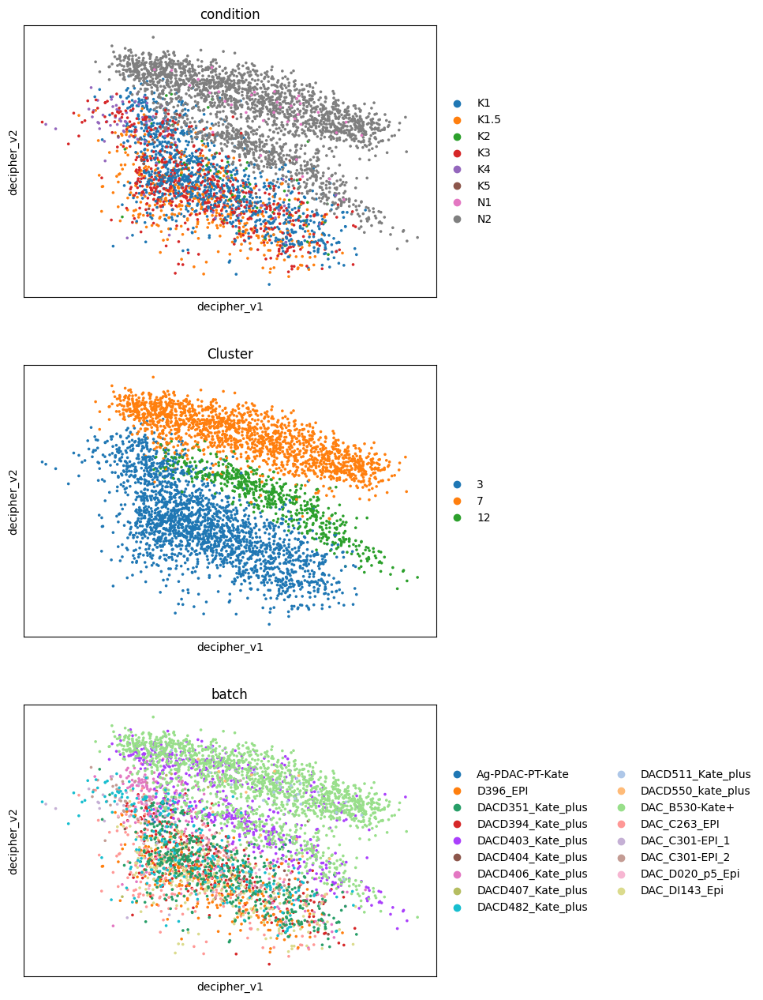

In [108]:
sc.pl.embedding(adata,basis='decipher_v',color=['condition',"Cluster",'batch'],layer='log_norm',ncols=1, save="decipher_pdac.pdf")

# Rotate Axes to Match ADM

2024-10-02 14:27:19,707 | INFO : Clustering cells using scanpy Leiden algorithm.
2024-10-02 14:27:19,707 | INFO : Step 1: Computing neighbors with `sc.pp.neighbors`, with the representation decipher_z.


computing neighbors
    finished (0:00:04)


2024-10-02 14:27:24,202 | INFO : Step 2: Computing clusters with `sc.tl.leiden`, and resolution 0.5.


running Leiden clustering
    finished (0:00:01)


2024-10-02 14:27:25,742 | INFO : Added `.obs['decipher_clusters']`: the cluster labels.
... storing 'Cluster' as categorical


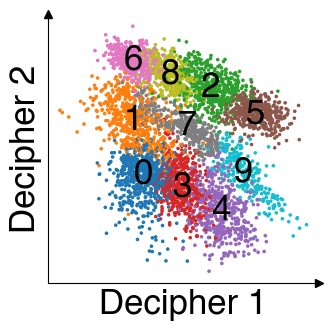

In [230]:
dc.tl.cell_clusters(adata, n_neighbors=15, leiden_resolution=.5)
dc.pl.decipher(adata, ["decipher_clusters"], legend_loc="on data");

... storing 'Cluster' as categorical


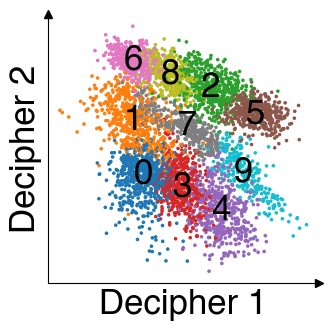

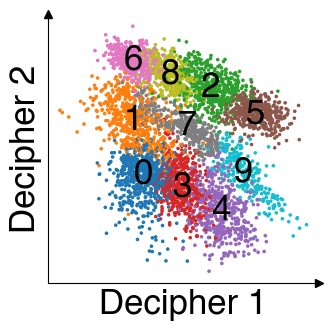

In [231]:
dc.pl.decipher(adata, ["decipher_clusters"], legend_loc="on data")

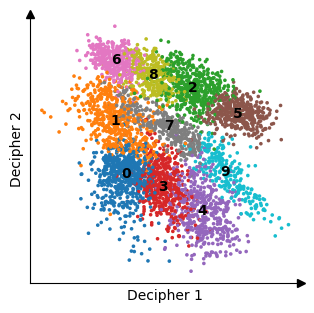

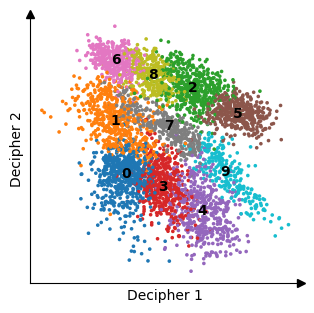

In [112]:
dc.pl.decipher(adata, ["decipher_clusters"], legend_loc="on data")

In [232]:
dc.tl.decipher_rotate_space(
    adata,
    v1_col="decipher_clusters",
    v1_order = ['6','8','2','5'],
    v2_col="Cluster",
    v2_order=['3','12','7']
)

2024-10-02 14:27:31,484 | INFO : Added `.obsm['decipher_v']`: the Decipher v space.
2024-10-02 14:27:31,485 | INFO : Added `.obsm['decipher_z']`: the Decipher z space.


# Trajectory Inference

In [233]:
%matplotlib inline

In [350]:
dc.tl.trajectories(
    adata,
    dc.tl.TConfig(name='kras',
        start_cluster_or_marker='1',
        end_cluster_or_marker='4',
        subset_col=None,
        subset_val=None,
        cluster_ids_list=['1','0','3','4'],
        subset_percent_per_cluster=0.3,
        min_cell_per_cluster=10,),
)

2024-10-16 13:05:54,078 | INFO : Trajectory kras : ['1', '0', '3', '4'])
2024-10-16 13:05:54,083 | INFO : Added trajectory kras to `adata.uns['decipher']['trajectories']`.


In [344]:
dc.tl.trajectories(
    adata,
    dc.tl.TConfig(name='normal 2',
        start_cluster_or_marker='1',
        end_cluster_or_marker='9',
        subset_col=None,
        subset_val=None,
        cluster_ids_list=['1','7','9'],
        subset_percent_per_cluster=0.3,
        min_cell_per_cluster=10,),
)

2024-10-16 13:04:32,879 | INFO : Trajectory normal 2 : ['1', '7', '9'])
2024-10-16 13:04:32,884 | INFO : Added trajectory normal 2 to `adata.uns['decipher']['trajectories']`.


In [348]:
dc.tl.trajectories(
    adata,
    dc.tl.TConfig(name='normal 1',
        start_cluster_or_marker='6',
        end_cluster_or_marker='5',
        cluster_ids_list=['6','8','2','5'],
        subset_col=None,
        subset_val=None,
        subset_percent_per_cluster=0.3,
        min_cell_per_cluster=10,),
)

2024-10-16 13:05:46,382 | INFO : Trajectory normal 1 : ['6', '8', '2', '5'])
2024-10-16 13:05:46,388 | INFO : Added trajectory normal 1 to `adata.uns['decipher']['trajectories']`.


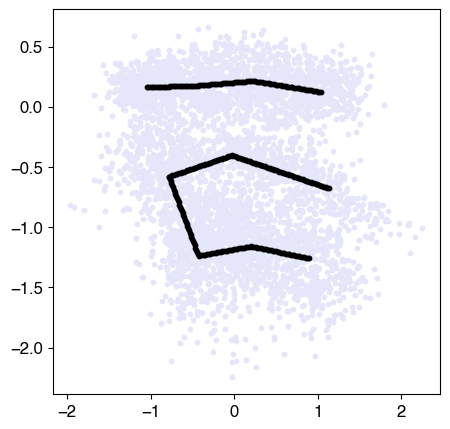

In [351]:
fig,ax=plt.subplots(1,1,figsize=(5,5))
ax.scatter(adata.obsm['decipher_v'][:,0],
           adata.obsm['decipher_v'][:,1],c='lavender',s=10)

#X = adata.uns["decipher"]['trajectories']['normal_stress']['points']
#ax.scatter(X[:,0],X[:,1],c='k',s=10)

X = adata.uns["decipher"]['trajectories']['normal 2']['points']
ax.scatter(X[:,0],X[:,1],c='k',s=10)

X = adata.uns["decipher"]['trajectories']['normal 1']['points']
ax.scatter(X[:,0],X[:,1],c='k',s=10)

X = adata.uns["decipher"]['trajectories']['kras']['points']
ax.scatter(X[:,0],X[:,1],c='k',s=10)

2024-10-16 13:06:02,790 | INFO : Added `.obs['decipher_time']`: the decipher time of each cell.


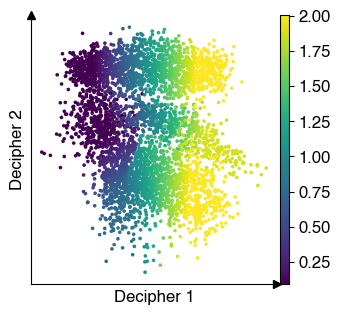

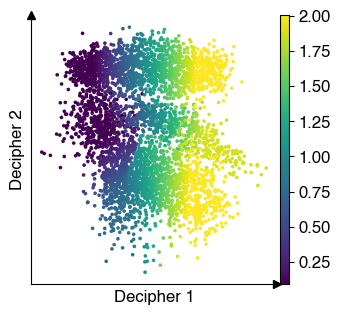

In [352]:
dc.tl.decipher_time(adata)
dc.pl.decipher_time(adata)

In [353]:
dc.tl.decipher_gene_imputation(adata)

2024-10-16 13:06:06,035 | INFO : Added `.layers['imputed']`: the Decipher imputed data.


In [354]:
dc.tl.gene_patterns(adata)

In [122]:
adata.layers["counts"]=adata.X

In [27]:
adata.write_h5ad("PDAC_cassandra_Decipher_run.h5")

In [294]:
adata = sc.read_h5ad("PDAC_cassandra_Decipher_run.h5")


In [295]:
sc.pp.calculate_qc_metrics(adata, inplace=True)
adata.layers["counts"] = adata.raw.X
# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
adata.obs['original_total_counts'] = adata.obs['total_counts']

# log10 original library size
adata.obs['log10_original_total_counts'] = np.log10(adata.obs['original_total_counts'])

# Normalize by median library size
med = np.median(adata.obs['original_total_counts'])
sc.pp.normalize_total(adata, target_sum = med)

normalizing counts per cell
    finished (0:00:00)


In [296]:
#log transform + 1 and updates adata.X
sc.pp.log1p(adata)
ad_normed = adata.to_df()

In [13]:
kras_sig = [
    "Mcpt1", "Muc6", "Muc3a", "Sez6", "Pkp1", "Rgs13", "Mcpt2", "Csf2", "Tph1", "Tm4sf20", "Sh2d7", "St8sia3",
    "Onecut3", "A4gnt", "Tmprss11e", "Chil4", "Gnat3", "Il1a", "Krt16", "Bcl11b", "Npy", "Vgf", "Gal3st2", "Sox11",
    "Tnnt2", "Sv2c", "Pthlh", "Chgb", "Chit1", "Cwh43", "Muc5ac", "Add2", "Irs4", "Mcpt8", "Cd177", "Rasgrf1",
    "Gm2115", "Gkn2", "Pou2f3", "Ptprt", "F5", "Ano7", "Fev", "Nptx1", "Tns4", "Gkn1", "Cidea", "Gm44223", "Slc9a3",
    "Gcnt3", "Cck", "Adgrg4", "Gast", "Ghrl", "Aqp5", "Ern2", "Lgr6", "Hmga2", "Scin", "Akr1b7", "Avil", "Dpcr1",
    "Foxi1", "Shisa6", "Fstl4", "Cyp26a1", "Hck", "Agr2", "Shh", "Spib", "Slc26a3", "Aldh1a3", "Lgals4", "Samd5",
    "Cdkn2a", "Gm32742", "Gm12860", "Nepn", "Dmkn", "Rfx6", "Adcy8", "Sh2d6", "Gm26603", "AC112274.1", "4631405K08Rik",
    "Gm44985", "Ankdd1b", "Sh2d5", "Dynap", "Gm12296", "Gip", "S100b", "Mmp13", "Aadac", "Moxd1", "Otop3",
    "Cyp2c44", "Strip2", "Ihh", "Atp6v0d2", "Gdf6", "Clca1", "Mboat4", "Jakmip1", "Trim29", "Ccdc129", "Psapl1",
    "Cacna1h", "Gm9930", "Tmem255a", "Serpinb5", "Acsbg1", "Bcas1", "2310007B03Rik", "Mall", "Tff1", "Gm34425",
    "Gm44275", "Ndst3", "Wif1", "Nptx2", "Scn9a", "Diras2", "Muc4", "Ccdc187", "Trpm5", "Casr", "Ap3b2", "Vstm2b",
    "2010109I03Rik", "Cd109", "Gm42528", "Gm43221", "Gm43490", "Nkx6-3", "Pcdh11x", "Asb4", "Inhba", "Wisp2",
    "Lypd1", "Onecut2", "Erich3", "Gm37549", "Alox5", "Gpr55", "Fer1l4", "Gramd2", "Prdm8", "Adam28", "Mfsd2a",
    "Gm37261", "Gm830", "Gata5", "Adamdec1", "Tigit", "AC123738.2", "Slc6a2", "Vdr", "Tmem163", "Kcnn4", "Dkk2",
    "Hepacam2", "Ereg", "AC153364.1", "Aldob", "Fam107a", "Areg", "Ldlr", "Mapk8ip2", "Nrgn", "Neurog3", "Hdac9",
    "Gpa33", "Egfl6", "Phgr1", "Hs3st1", "Ros1", "Pir", "Naip1", "Gabrp", "Cldn1", "Tmem236", "Henmt1", "Prg4",
    "9230105E05Rik", "Asz1", "Fyb", "Fn1", "Aqp3", "Gm19972", "AC153566.1", "Pkd1l3", "Itgb3", "Tnni2", "Apob",
    "Nrk", "Mmp12", "Cdh23", "Atp2a3", "Ffar2", "Pbp2", "Camk1g", "Pgc", "Lemd1", "2010300F17Rik", "Cyp2c65",
    "Gm9821", "Chl1", "Gm38014", "March4", "Vwa5b2", "1700006J14Rik", "Ptpre", "Irx3", "Cdh17", "Neurod1",
    "5830408C22Rik", "Il24", "Kcnma1", "Galnt6", "St8sia6", "Nt5e", "Gata3", "Lepr", "Lrrc66", "Pyy", "Anxa8",
    "Adgrl3", "Limch1", "Slc4a11", "Slc13a2", "Dgki", "Ache", "Stamos", "Ctla2a", "5830432E09Rik", "Pax9", "Car2",
    "Stac", "Dnah9", "Uts2", "Rflna", "Idi1", "Gm17025", "Arnt2", "4833422C13Rik", "Hpgds", "AC132265.1", "Lama3",
    "Gkn3", "Ncald", "Acsm3", "B3gnt7", "AU022754", "Celf4", "Gm15958", "Car12", "AA467197", "Aspa", "Kcne3",
    "Baiap2l2", "Pzp", "Gm37855", "Tac1", "Scel", "Card14", "Ush1g", "2010007H06Rik", "Nod2", "Olfm4", "Bmx",
    "Cdh13", "D630003M21Rik", "2610203C20Rik", "Gm19391", "Penk", "Tmem150b", "Insrr", "Bfsp1", "Pla2g2d", "Fam83e",
    "Pik3r5", "Spock3", "Sox21", "Insm1", "Pitpnm3", "Npnt", "Rgs17", "Igf2", "Slc9a2", "Egr3", "Gm44270", "Degs2",
    "Ivl", "Anxa1", "Nrip3", "Kcnh6", "Bace2", "Vegfd", "Lamc2", "Fst", "Mgst2", "Etv1", "Myo1a", "Tubb3",
    "Ptprn", "Aldoc", "Col10a1", "Pla2g2f", "Cftr", "Tenm1", "Tspan2", "Mmp28", "Syn1", "Golm1", "Arc", "Odaph",
    "Dll1", "Rasgrp1", "Mir6386", "Dscaml1", "Shf", "Ret", "Ltc4s", "S100a14", "Igsf1", "Matk", "Tox2", "Pax6",
    "Gm29237", "Rhof", "Gm37510", "Coro2a", "Gm45073", "Prss22", "Gm14005", "Wnt7b", "Pcsk9", "1700056N10Rik",
    "Pnpla3", "Il11", "Alox5ap", "Mst1r", "Pcolce2", "Tiam2", "Eva1a", "Ifitm1", "Gm20735", "Epha4", "Tspan12",
    "Tmem45a", "Atp6v0a4", "Slc4a8", "9330182L06Rik", "Sgpp2", "Mycn", "Ypel4", "Slc26a2", "Mmp9", "Col18a1",
    "C230053D17Rik", "Eps8l3", "Smpd3", "Ugt8a", "Cldn2", "Trerf1", "Plac8", "Cnnm1","Adcy2", "Pde1c", "Ephb2", "Tmem45b", "Pcsk1n", "Padi1", "Tnfrsf23", "Plekhd1", "Iglon5", "Cacna2d1", "Gm43845", 
    "Tnfrsf22", "Lrrc26", "Mgat3", "Fam167a", "Slc12a5", "Bco2", "Slco2a1", "Rnf152", "Tnik", "4930594C11Rik", "Tead4", 
    "Samd12", "Ugt1a7c", "Olr1", "Slc28a3", "Begain", "Hpcal4", "Gpx2", "Rnf186", "Col9a3", "Dok7", "Lmcd1", "Gm14636", 
    "Eya2", "Far1os", "Foxq1", "Gm37536", "Snap25", "Disp2", "Gm43275", "Il18rap", "Ctse", "Arl14", "Pcyt1b", "Pdpn", 
    "Robo1", "Chad", "Tnfsf9", "Sema3e", "Gng4", "Lag3", "9830144P21Rik", "Baiap3", "Il4ra", "Cited4", "Igfbp5", "Creb3l4", 
    "Tmprss4", "Lypd8", "Vegfc", "Etv4", "Wnt7a", "Emp1", "Vsig1", "Lrrk2", "Hk2", "Acss1", "Gm14137", "Galnt5", "Gprc5b", 
    "Hr", "Rnf24", "Gjb3", "Dbpht2", "Plaur", "Kif21b", "Rbms3", "Pglyrp1", "Nup210l", "Fmnl2", "Cyp51", "Sfn", "Col11a2", 
    "Abcb1a", "Utp14b", "Cpxm2", "Adh1", "Lbp", "Acox2", "Spry4", "Adamts6", "Cdh6", "Rps11-ps1", "Rbp4", "Lrg1", "Stard4", 
    "Zfp469", "Ecm1", "BC016579", "Gm36940", "Ces2g", "P2ry1", "Pof1b", "Chst4", "Acsl3", "Cadm1", "Prr15", "Il33", 
    "Sema5a", "Adgrg2", "B4galt6", "Ildr2", "Fosl1", "Cfap45", "Ccbe1", "Heph", "Tubb4a", "Cd44", "Dclk1", "St3gal6", 
    "Plek2", "Slc17a4", "Ltbp4", "Ltf", "Bglap3", "Mast4", "St18", "Lrp8", "Piezo2", "Atp2b4", "Il23a", "Gjb4", "Tnc", 
    "Slc45a3", "Nectin3", "Pmepa1", "Chga", "Cfi", "Phlda1", "Jag1", "Ccnd1", "Hectd2", "Adra2a", "Vav1", "Vav3", 
    "Ppp1r1b", "Hmgcs1", "Tmem229a", "Fgfr4", "Nalcn", "Napepld", "Msmo1", "Plekhg1", "Map6", "Ehbp1l1", "Hspa2", 
    "Tox3", "Naip5", "Spats2l", "Porcn", "B3gnt3", "Leng9", "Gnao1", "Klf12", "S100a6", "Adgre5", "Col27a1", "Atp10b", 
    "Mgat5", "Dll4", "Peg10", "Slc18a1", "Runx1", "Peg3", "Btbd17", "Acpp", "Pou2af1", "Galnt12", "Trpv4", "Kcnd1", 
    "Slc20a1", "Btc", "Hmgcr", "Arl4c", "Has3", "Elmo1", "Mroh3", "Pla2g4a", "Ror2", "Fam102b", "Sfrp2", "Duoxa2", 
    "Fgf1", "Plce1", "Styk1", "Kif12", "Atp7b", "Spry2", "Itga2", "Papss2", "Sprr2a3", "Epas1", "Gm17322", "Ngf", 
    "Camk4", "Tm7sf2", "Mia", "Crybg1", "Slc5a3", "Crim1", "Aox1", "Lmo7", "Sema7a", "Sema6a", "Spef1", "Prss35", 
    "Sobp", "Ripk3", "Hcar2", "Vcan", "Hpse", "F2rl1", "Upp1", "Pear1", "Rapgef3", "Acnat1", "Pdgfc", "Cdc14a", "Tspan8", 
    "Gm28809", "Meg3", "Ckmt1", "Traf1", "Cxcl1", "Bcar3", "Myzap", "Gm38228", "Plscr1", "Sdk1", "F2r", "Tlr4", "Fam84a", 
    "Sdcbp2", "Alox12", "Naip6", "Lgals3", "Fhdc1", "Sh3kbp1", "Zfp36l2", "9130008F23Rik", "Pde10a", "Cxcl2", "Ly6d", 
    "Tnfaip3", "Slc16a10", "Epha2", "Hsd11b2", "Efnb2", "Cx3cl1", "Syt13", "Ncmap", "Slc2a1", "Calml4", "Kctd11", 
    "Tc2n", "Rps6ka5", "Vil1", "Ackr3", "Cdkn2b", "Wnt5a", "Mtcl1", "Fgfr2", "N4bp3", "Cnnm4", "Pigr", "Dusp5", 
    "Eps8", "Ephb3", "Nr4a1", "Smim6", "Klf4", "Tnfrsf1b", "Bmyc", "Pcsk5", "Plekhb2", "Plcd3", "Parvb", "Jag2", 
    "Gm44950", "Steap2", "Dyrk3", "Hk1", "Cobl", "Sowahc", "Hsd17b7", "Bhlhe41", "Sc5d", "Itga5", "Celf3", "Hmcn2", 
    "Tcaf2", "Sgcb", "2610035D17Rik", "Acat2", "Itpr3", "Tshz2", "Hspa1a", "Serpine1", "Sh3bgrl2", "Efna5", "Tspan7", 
    "Rhobtb2", "Col16a1", "Gm7694", "Dusp6", "Msn", "Ahcyl2", "Klf5", "4930581F22Rik", "Dpysl2", "Rian", "Ccdc114", 
    "Map3k21", "Tmem171", "Ppfibp2", "Lrp5", "Plk3", "Paqr5", "Arhgef3", "Efemp1", "Srebf2", "Ptger4", "Zc3h12a", 
    "Ttc39aos1", "Sertad4", "Spsb1", "Lpcat2", "Agpat4", "Slc6a8", "Tppp3", "Pdgfb", "Eml1", "Zfand2a", "Bcl3", "Eepd1", 
    "Atp2b1", "Plk1", "Shc2", "Pxdc1", "Gsta4", "Stom", "Plau", "Fermt1", "Fbln2", "Bcl2", "Slc35e4", "Il18r1", "Hbegf", 
    "Gpm6b", "4930523C07Rik", "Ppl", "Hspa1b", "Raph1", "Las1l", "Fry", "Cav2", "Nrip1", "Anxa2", "Ctgf", "Dopey2", "Atg9b", 
    "Cavin1", "Smtn", "Rel", "Fam43a", "Ahnak", "Arhgap42", "Taf4b", "Adap1", "Fhl2", "Slc12a7", "Sulf2", "Mpzl1", 
    "Pparg", "Dock8", "Myo6", "Spred3", "Pde4d", "Gsto1", "Gprc5a", "Slc12a2", "Adgrl2", "Cdc42ep2", "Bag3", "Plec", 
    "Tubb6", "Tubb2a", "C1galt1", "Zfp618", "Ano1", "Ezr", "Dnajb1", "Slc9a5", "Krt7", "Rasa3", "Hyal1", "Zdhhc15", 
    "Il1rap", "Dock4", "Camta1", "Abl2", "Endod1", "Etv5", "Fam46a", "Erbb3", "Fscn1", "Syt8", "Cotl1", "Wfdc2", 
    "Dusp7", "Med13l", "Itpripl2", "Tesc", "Zbtb7c", "Frmd4a", "Ddhd1", "Galnt7", "Pfkfb4", "Atp10a", "Mlph", 
    "Hmgcll1", "Kirrel", "Elf3", "Bpgm", "Oat", "Sh3rf1", "Glp1r", "Mgat4a", "Numbl", "Kif23", "Camk2n1", "Antxr2", 
    "Sox9", "Acox1", "Hilpda", "Cbarp", "Atp1b1", "Sbno2", "Ippk", "Tnk2", "Sdc1", "Atp6v0a1", "Nsdhl", "Vegfa", 
    "Mtmr11", "Me1", "Fxyd3", "Sema3b", "Cavin3", "Slc4a7", "Lamb1", "Clcf1", "Klhl21", "Rnf19b", "Prnp", "Gipc2", 
    "Il13ra1", "Srxn1", "Pgm2l1", "Spred2", "Rasa2", "Tnfrsf10b", "Dst", "Rhpn2", "Xdh", "Cpne2", "Acss2", 
    "Nol4l", "Cerk", "Gjb1", "Ociad2", "BC024978", "Ugcg", "Pdlim7", "Igf2bp2", "Errfi1", "Epcam", "Tenm4", 
    "Gsdmd", "Cnnm2", "Adam9", "Pmvk", "Foxo1", "Pls3", "Atg10", "Zfp703", "Asap2", "Acvr1", "Abcc4", "Map7d1", 
    "Thsd4", "Frmd4b", "Rnf217", "Itga3", "Galnt4", "Npr2", "Prag1", "Efnb1", "Insig1", "Pdxk", "Sema4b", 
    "Pfkp", "Sema6d", "Lss", "St3gal4", "Dmpk", "Paqr4", "Usp53", "Gfpt1", "Egflam", "1700025G04Rik", "Rnasel", 
    "Arhgap44", "Casp8", "Spred1", "Itgb4", "Sash1", "Grk5", "Chsy3", "C130074G19Rik", "Frrs1", "Sft2d1", 
    "Epb41l2", "Lmna", "St3gal5", "Adamts1", "Tmem173", "Nr1d1", "Gas6", "Capg", "Smpdl3a", "Tuba4a", 
    "Ppp1r13l", "Klf13", "Creb3l2", "Lad1", "Gale", "Kctd9", "Trak1", "Tspan15", "Camkk2", "Slc37a1", "Ksr1", 
    "Myof", "Map2k3", "Slc6a6", "Mapre2", "Spaca6", "Map3k14", "Phlpp1", "Mapk6", "Scnn1a", "Uap1", "Pcyt2", 
    "Srf", "Cdk19", "Cflar", "Tnrc18", "Hspa4l", "5730559C18Rik", "Klf3", "Serinc2", "Iffo2", "Slc9a1", "Ptk2b", 
    "Ids", "Ncor2", "Itsn1", "Dzip1l", "Mrps6", "Trim56", "Hnf1b", "Nat6", "Gne", "Arhgef40", "Myo10", 
    "Bcl2l11", "Nck2", "Irak2", "Mlxip", "Foxk1", "Inf2", "Fam129b", "Klf10", "Tob2", "Hkdc1", "Fam214b", 
    "Exoc6", "Ldlrad4", "Sipa1l1", "Aacs", "Tle1", "Nbeal2", "Erbb2", "Cmip"
]



In [14]:
kras_sig = [i.upper() for i in kras_sig]

In [297]:
adata.layers["lognorm"]=adata.X

In [318]:
adata.obs["KRAS_signature"] = adata.to_df()[np.intersect1d(adata.var_names,kras_sig)].mean(axis=1)

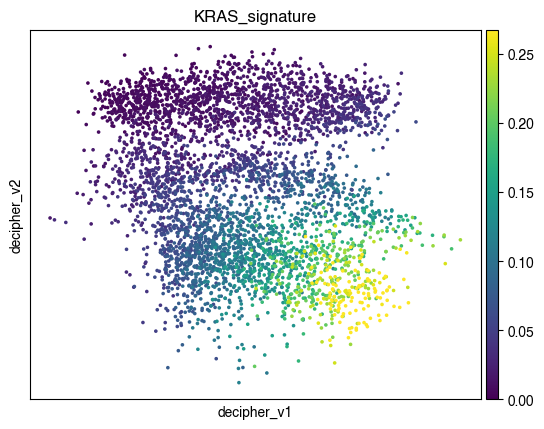

In [199]:
sc.pl.embedding(adata,basis='decipher_v',color=['KRAS_signature'],vmax='p98', save="decipher_KRAS.pdf")

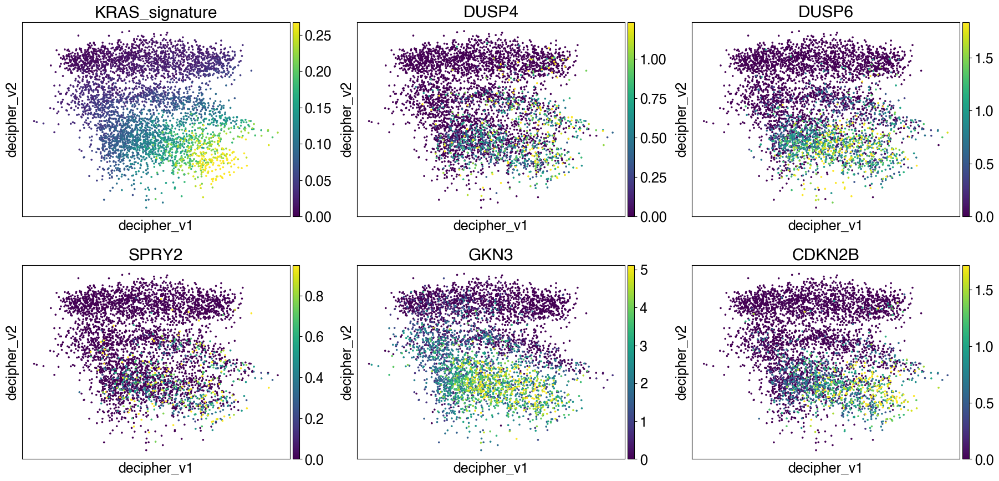

In [321]:
plt.rcParams.update({'font.size': 18}) 
sc.pl.embedding(adata,basis='decipher_v',color=['KRAS_signature','DUSP4', 'DUSP6', 'SPRY2',"GKN3","CDKN2B"]
                ,vmax='p98', ncols=3, layer='lognorm', save="final_decipher_lognorm_markers.pdf")

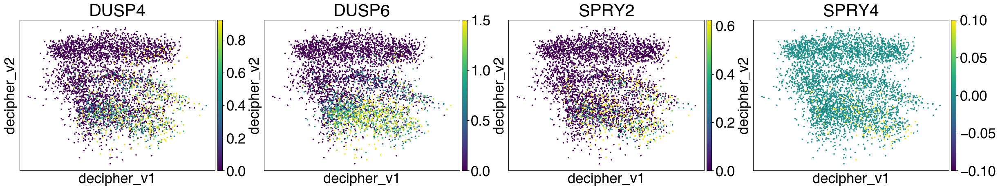

In [315]:
sc.pl.embedding(adata,basis='decipher_v', color=['DUSP4', 'DUSP6', 'SPRY2', 'SPRY4'], layer='lognorm',vmax="p95")

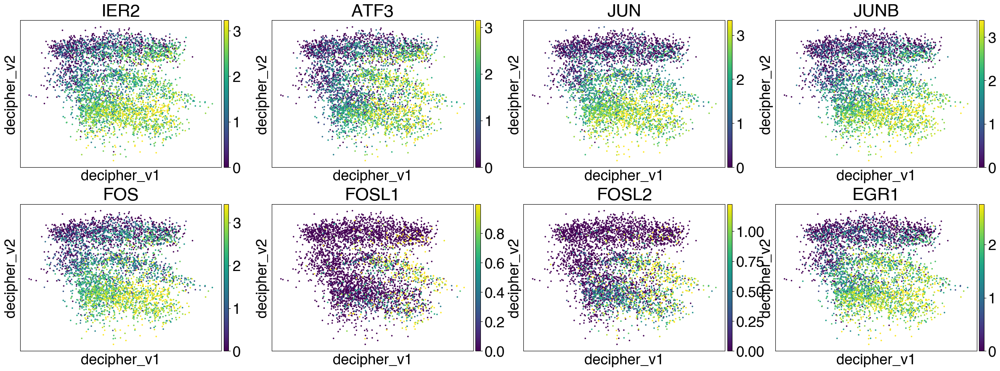

In [316]:
sc.pl.embedding(adata,basis='decipher_v', color=["IER2", "ATF3", "JUN", "JUNB", "FOS", "FOSL1", "FOSL2", "EGR1"], layer='lognorm',vmax="p95")


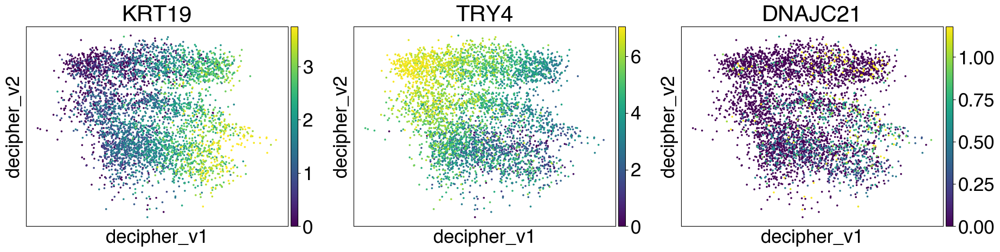

In [298]:
plt.rcParams.update({'font.size': 25}) 
sc.pl.embedding(adata,basis='decipher_v',color=['KRT19',"TRY4","DNAJC21"]
                ,vmax='p98', ncols=3, layer='lognorm')#, save="final_decipher_lognorm_krt.pdf")

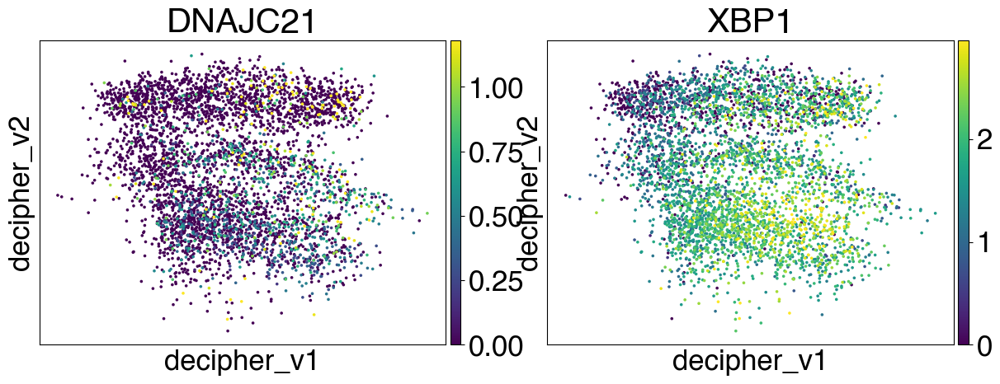

In [336]:
plt.rcParams.update({'font.size': 25}) 
sc.pl.embedding(adata,basis='decipher_v',color=["DNAJC21","XBP1"]
                ,vmax='p98', ncols=3, layer='lognorm',) #save="final_decipher_lognorm_stress.pdf")

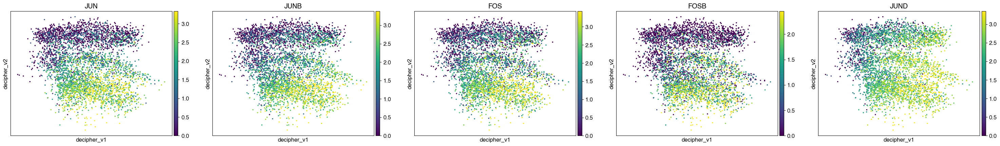

In [358]:
sc.pl.embedding(adata,basis='decipher_v',color=['JUN',"JUNB","FOS","FOSB","JUND"],ncols=5,layer='lognorm',vmax='p95', save="decipher_interesting_lognorm.pdf")
                

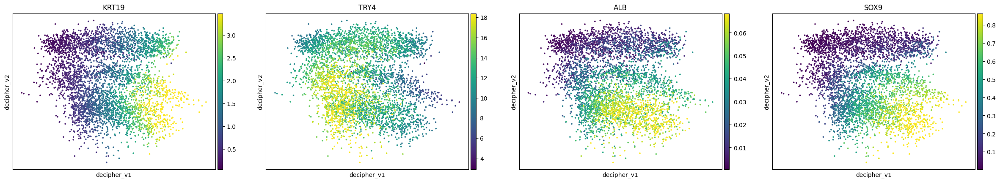

In [50]:
sc.pl.embedding(adata,basis='decipher_v',color=['KRT19',"TRY4","ALB","SOX9"],layer='decipher_imputed',vmax='p95')

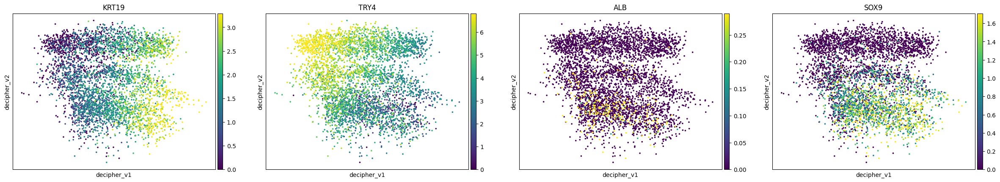

In [23]:
sc.pl.embedding(adata,basis='decipher_v',color=['KRT19',"TRY4","ALB","SOX9"],layer='lognorm',vmax='p95')

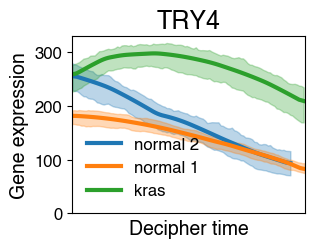

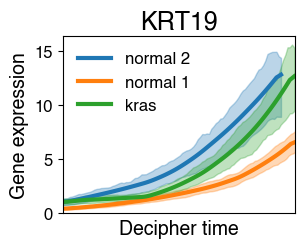

In [355]:
dc.pl.gene_patterns(adata, "TRY4")
plt.savefig("try4_patterns.pdf", bbox_inches="tight")
dc.pl.gene_patterns(adata, "KRT19");
plt.savefig("patterns.pdf")
#plt.show()

# Basis Decomposition

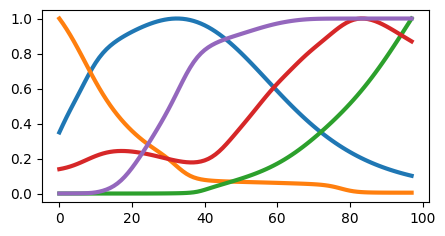

Loss: -10578572.8 - Relative Error: 0.01%:  86%|▊| 8633/10000 [06:31<01:02, 22.03it/


In [129]:
training_losses = dc.tl.basis_decomposition(adata, seed=0);

In [130]:
dc.tl.disruption_scores(adata)
disruption_scores = adata.var[[c for c in adata.var if "decipher_disruption" in c]].sort_values(
    "decipher_disruption_combined", ascending=False
)

2024-09-23 14:54:49,767 | INFO : Added `.var['decipher_disruption_shape']`: shape disruption scores
2024-09-23 14:54:49,768 | INFO : Added `.var['decipher_disruption_scale']`: scale disruption scores
2024-09-23 14:54:49,768 | INFO : Added `.var['decipher_disruption_combined']`: combined disruption scores
2024-09-23 14:54:49,783 | INFO : Added `.uns['decipher']['disruption_scores']`: disruption scores
2024-09-23 14:54:49,783 | INFO : Added `.uns['decipher']['disruption_scores_samples']`: disruption scores probabilistic samples


In [131]:
disruption_scores

,decipher_disruption_shape,decipher_disruption_scale,decipher_disruption_combined
PENK,1.140765,1.355443,14.078988
KIF18B,0.137471,1.644705,14.064574
FAM64A,0.129839,1.483128,12.878107
KRT6A,0.079359,1.916113,12.595772
CIT,0.119413,1.967070,12.557010
...,...,...,...
PDLIM4,0.186351,0.136696,0.622408
TIMP2,0.182354,0.182371,0.619136
LSM8,0.171786,0.080787,0.591497
CAR9,0.166048,0.057071,0.570418


In [132]:
sorted_disruption = disruption_scores.sort_values("decipher_disruption_combined", ascending=False)

In [154]:
sorted_disruption.loc[np.intersect1d(kras_sig, sorted_disruption.index)].sort_values("decipher_disruption_combined", 
                                                                                     ascending=False).to_csv("KRAS_sig_disruption_scores.csv")

## Visualize latent space

In [17]:
v = adata.obsm["decipher_v"]
z = adata.obsm["decipher_z"]

In [ ]:
#z3 is regeneration specific
#Z4 should have krt19/hallmarks of ADM regardless of mutation
#negative Z6 is  better for KRAS/ Z0 is capturing stress vs unstressed

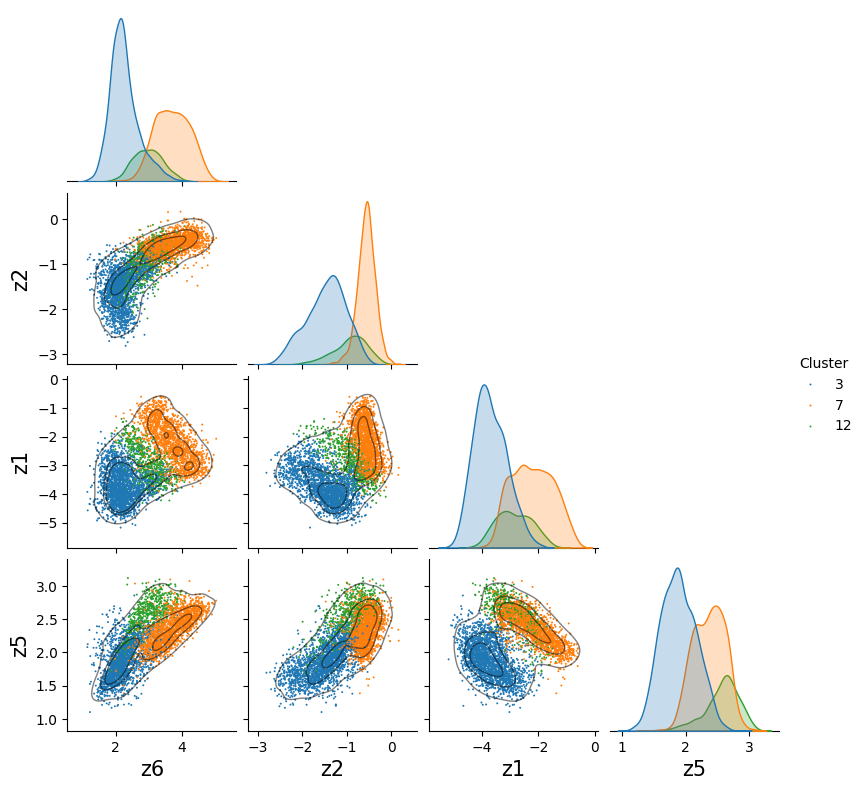

In [140]:
def f(hue,*args, **kwargs):
    sns.kdeplot(**kwargs)
    
tmp_data = pd.DataFrame(adata.obsm['decipher_z'], columns=["z%d" % (i) for i in range(10)])
#tmp_data["origin"] = adata.obs["origin"].values
tmp_data["Cluster"] = adata.obs["Cluster"].values

with plt.rc_context({'axes.titlesize':15 , 'axes.labelsize':15}):

    pg = sns.pairplot(
        tmp_data,
        x_vars=["z6","z2","z1","z5"],
        y_vars=["z6","z2","z1","z5"],
        corner=True,
        hue="Cluster",
        plot_kws={"s": 2, "linewidth":0, "rasterized":True},
        height=2,
    )
    pg.map_lower(f, levels=4, color="0", alpha=0.5, linewidths=1,)
plt.savefig("figures/decipher_z_corrs.pdf")

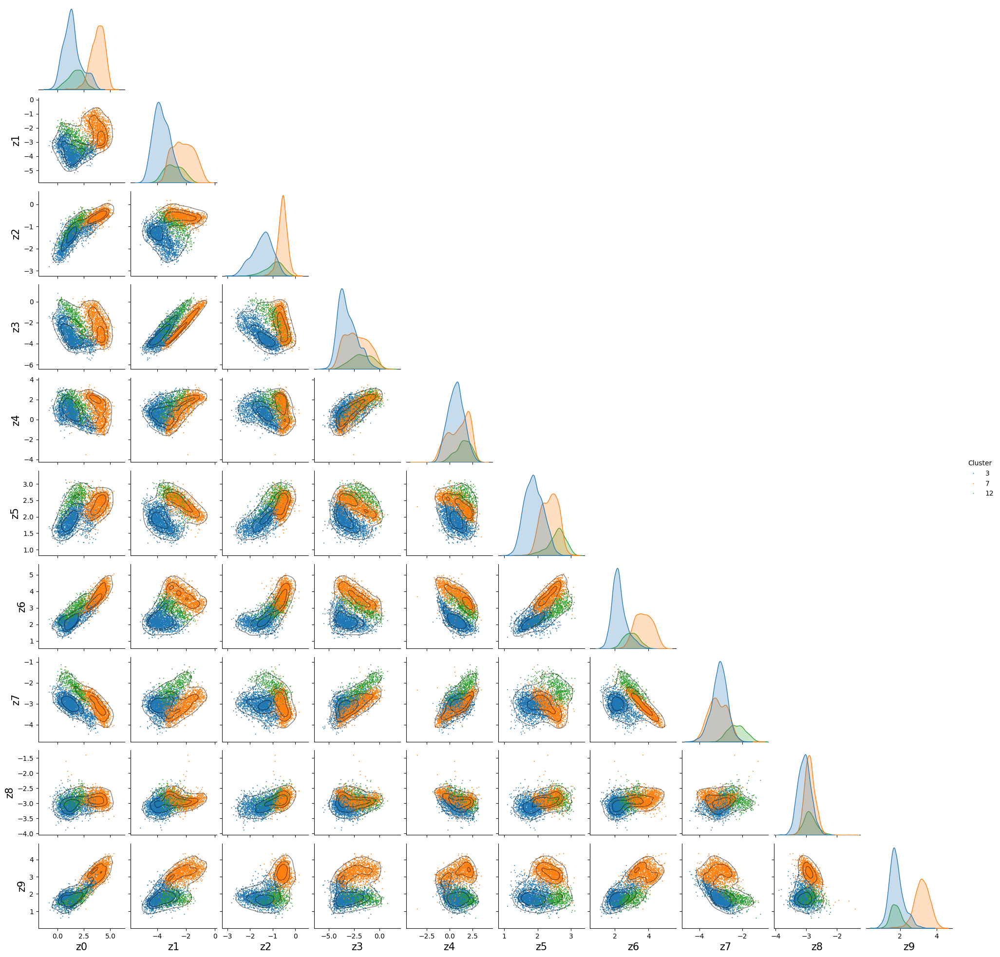

In [155]:
def f(hue,*args, **kwargs):
    sns.kdeplot(**kwargs)
    
tmp_data = pd.DataFrame(adata.obsm['decipher_z'], columns=["z%d" % (i) for i in range(10)])
#tmp_data["origin"] = adata.obs["origin"].values
tmp_data["Cluster"] = adata.obs["Cluster"].values

with plt.rc_context({'axes.titlesize':15 , 'axes.labelsize':15}):

    pg = sns.pairplot(
        tmp_data,
        x_vars=["z"+str(i) for i in range(10)],
        y_vars=["z"+str(i) for i in range(10)],
        corner=True,
        hue="Cluster",
        plot_kws={"s": 2, "linewidth":0, "rasterized":True},
        height=2,
    )
    pg.map_lower(f, levels=4, color="0", alpha=0.5, linewidths=1,)
plt.savefig("figures/decipher_z_corrs_big.pdf")

## Visualize

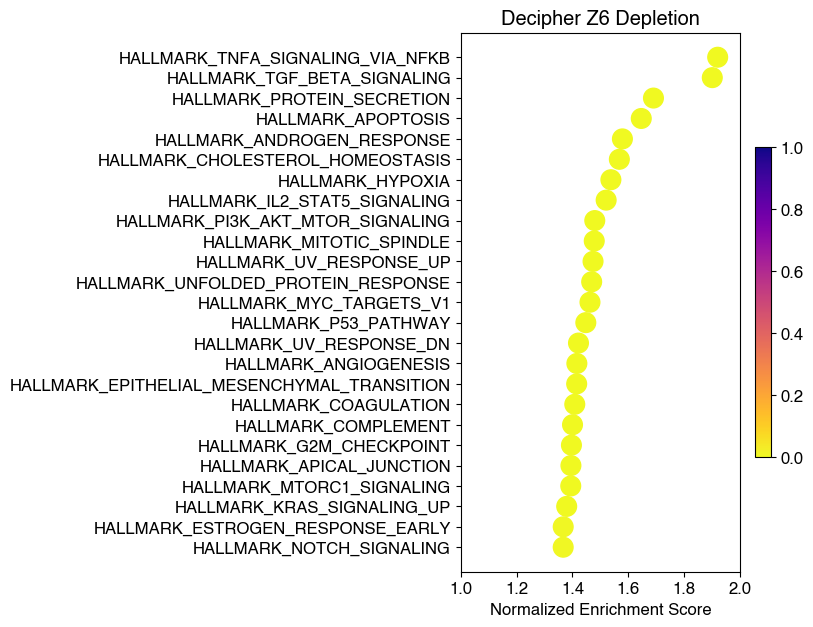

In [386]:
import os
path="PDAC_cassandra/z6_gsea/"
files=os.listdir(path)
for j in files:
    if "gsea_report_for_na_pos" in j and "tsv" in j:
        pos_path=j
    if "gsea_report_for_na_neg" in j and "tsv" in j:
        neg_path=j
#pos=pd.read_csv(path+pos_path,sep='\t')
neg=pd.read_csv(path+neg_path,sep='\t')

#tet2_p_dict_pos[k+"/p"+str(i)]=pos[pos["FDR q-val"]<.25]["NAME"]
#tet2_p_dict_neg[k+"/p"+str(i)]=neg[neg["FDR q-val"]<.25]["NAME"]

if neg.shape[0]>0:
    num=25
    if len(neg)<25:
        num=len(neg)

    fig = plt.figure(figsize=(4,7))
    dpl=plt.scatter([abs(float(f)) for f in neg["NES"][0:num]],np.flip([i for i in range(num)]),s=200,c=[float(p) for p in neg["FDR q-val"][0:num]],cmap='plasma_r',vmin=0,vmax=1)
    plt.yticks(ticks=np.flip([i for i in range(num)]),labels=neg["NAME"][0:num])
    plt.xlabel("Normalized Enrichment Score")
    #plt.xticks(ticks=np.arange(start=float(min(neg["NES"][0:num])),stop=float(max(neg["NES"][0:num])),step=(float(max(neg["NES"][0:num]))-float(min(neg["NES"][0:num])))/5))
    cbar=plt.colorbar(dpl,fraction=0.05)
    plt.title("Decipher Z6 Depletion")
    plt.xlim([1, 2])
    plt.savefig("Decipher Negative Z6.pdf",format='pdf',bbox_inches='tight')

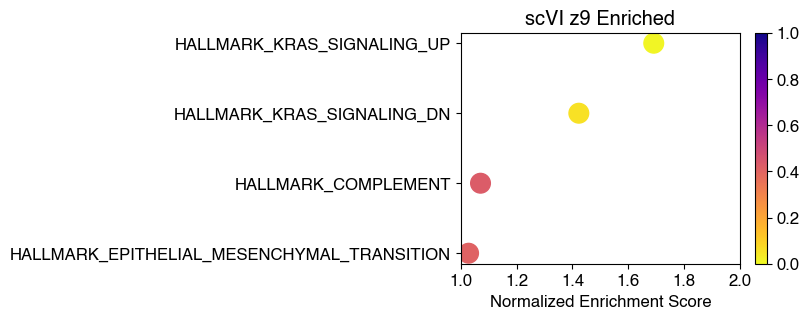

In [387]:
import os
path="PDAC_cassandra/scvi_z9/"
files=os.listdir(path)
for j in files:
    if "gsea_report_for_na_pos" in j and "tsv" in j:
        pos_path=j
    if "gsea_report_for_na_neg" in j and "tsv" in j:
        neg_path=j
pos=pd.read_csv(path+pos_path,sep='\t')
#neg=pd.read_csv(path+neg_path,sep='\t')
num=pos.shape[0]
#tet2_p_dict_pos[k+"/p"+str(i)]=pos[pos["FDR q-val"]<.25]["NAME"]
#tet2_p_dict_neg[k+"/p"+str(i)]=neg[neg["FDR q-val"]<.25]["NAME"]
fig = plt.figure(figsize=(4,3))
dpl=plt.scatter([float(f) for f in pos["NES"][0:num]],np.flip([i for i in range(num)]),s=200,c=[float(p) for p in pos["FDR q-val"][0:num]],cmap='plasma_r',vmin=0,vmax=1)
plt.yticks(ticks=np.flip([i for i in range(num)]),labels=pos["NAME"][0:num])
plt.xlabel("Normalized Enrichment Score")
#plt.xticks(ticks=np.arange(start=float(min(pos["NES"][0:num])),stop=float(max(pos["NES"][0:num])),step=(float(max(pos["NES"][0:num]))-float(min(pos["NES"][0:num])))/5))
cbar=plt.colorbar(dpl,fraction=0.05)
plt.xlim([1, 2])
plt.title("scVI z9 Enriched")
plt.savefig("scVI_positive_z9.pdf",format='pdf',bbox_inches='tight')

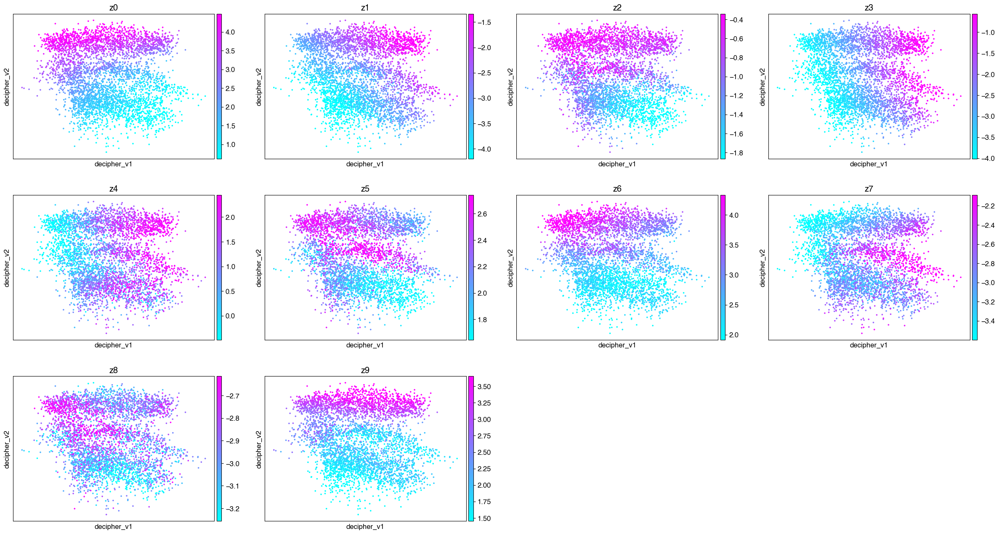

In [401]:
for i in range(z.shape[1]):
    adata.obs["z"+str(i)]=z[:,i]
sc.pl.embedding(adata,basis='decipher_v',color=["z"+str(i) for i in range(10)],
               vmin='p10',vmax='p95',cmap='cool', save="decipher_z.pdf")

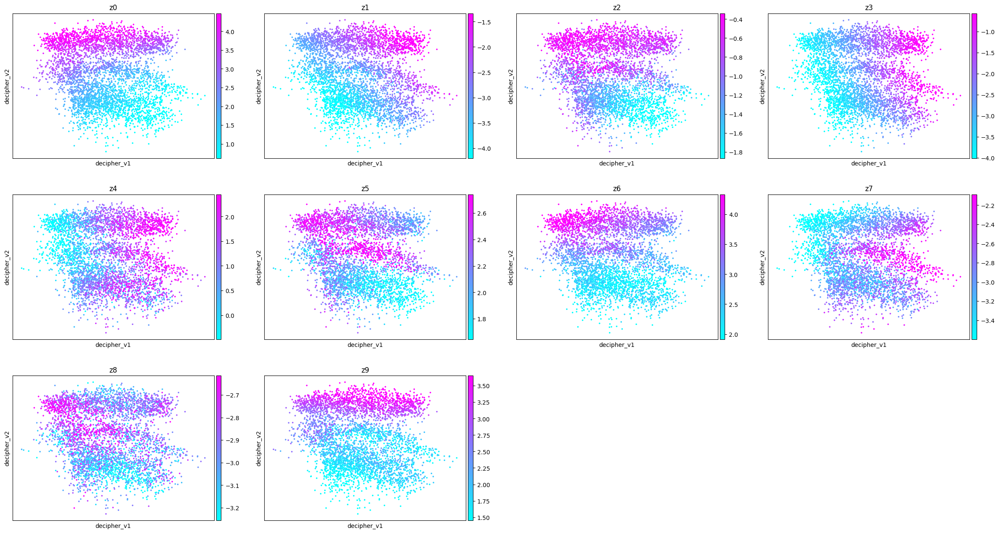

In [117]:
for i in range(z.shape[1]):
    adata.obs["z"+str(i)]=z[:,i]
sc.pl.embedding(adata,basis='decipher_v',color=["z"+str(i) for i in range(10)],
               vmin='p10',vmax='p95',cmap='cool', save="decipher_z.pdf")

In [97]:
z_df = pd.DataFrame(z, index=adata.obs_names)
v_df = pd.DataFrame(v, index=adata.obs_names)

obs = adata.obs
kras = obs[obs["Cluster"]=='3'].index
not_kras = obs[obs["Cluster"]!='3'].index

In [70]:
import scipy
t_tests = pd.DataFrame()
for i in range(10):
    t_tests[i] = scipy.stats.ttest_ind(z_df.loc[kras][i],z_df.loc[not_kras][i])

In [98]:
import scipy
vt_tests = pd.DataFrame()
for i in range(2):
    vt_tests[i] = scipy.stats.ttest_ind(v_df.loc[kras][i],v_df.loc[not_kras][i])

In [120]:
z_df_scvi.shape

(4393, 10)

In [71]:
t_tests.T.sort_values(by=0)[0]

6   -79.697531
2   -70.265001
1   -64.972132
5   -64.527143
0   -61.516763
9   -56.541079
3   -33.172030
8   -29.401190
4   -15.186147
7   -11.521230
Name: 0, dtype: float64

## Compare to scVI

In [278]:
test = sc.read_h5ad("PDAC_cassandra/figures/scvi_cassandra_pdac_no_batch_correction.h5")

In [284]:
test.obs["KRAS_signature"] = test.to_df()[np.intersect1d(test.var_names,kras_sig)].mean(axis=1)

In [268]:
test.X = test.layers["counts"]

In [269]:
sc.pp.calculate_qc_metrics(test, inplace=True)

# UPDATE OBS WITH USE

# store the current 'total_counts' under original_total_counts, which will not automatically be updated
# by scanpy in subsequent filtering steps
test.obs['original_total_counts'] = test.obs['total_counts']

# log10 original library size
test.obs['log10_original_total_counts'] = np.log10(test.obs['original_total_counts'])

# Normalize by median library size
med = np.median(test.obs['original_total_counts'])
sc.pp.normalize_total(test, target_sum = med)

normalizing counts per cell
    finished (0:00:00)


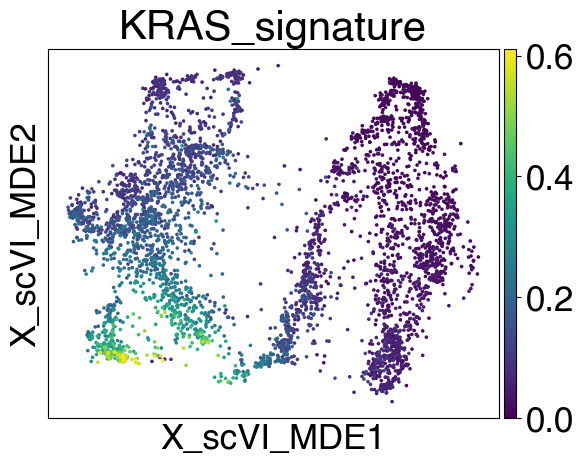

In [287]:
sc.pl.embedding(test,basis='X_scVI_MDE', color="KRAS_signature", save="scVI_KRAS.pdf")

In [114]:
z_df_scvi=pd.DataFrame(test.obsm["X_scVI"], index=test.obs_names)

In [115]:
t_tests_scvi = pd.DataFrame()
for i in range(10):
    t_tests_scvi[i] = scipy.stats.ttest_ind(z_df_scvi.loc[kras][i],z_df_scvi.loc[not_kras][i])

In [213]:
plot = pd.DataFrame({"Decipher":np.abs(t_tests.T.sort_values(by=0)[0]),"scVI":np.abs(t_tests_scvi.T.sort_values(by=0)[0])})

In [214]:
scipy.stats.ttest_ind(plot["Decipher"], plot["scVI"])

TtestResult(statistic=3.186947686152105, pvalue=0.005106896620948831, df=18.0)

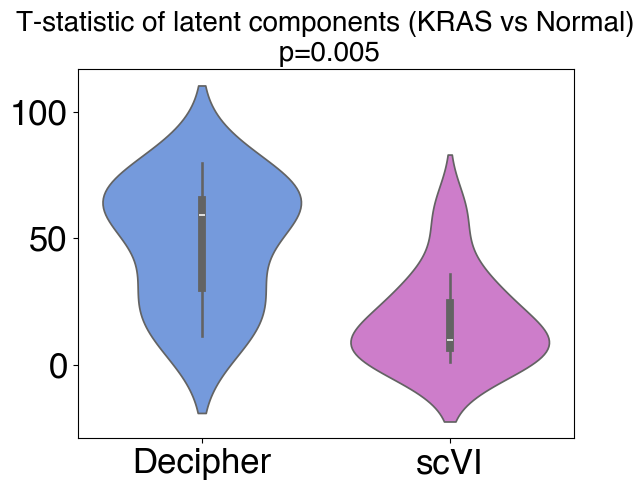

In [216]:
pal={"Decipher":"cornflowerblue","scVI":"orchid"}
sns.violinplot(plot, palette=pal)
plt.title("T-statistic of latent components (KRAS vs Normal)\n p=0.005", fontsize=20)
plt.savefig("PDAC_cassandra/figures/violins.pdf")

In [228]:
wass = pd.DataFrame()
for i in range(10):
    wass[i] = [scipy.stats.wasserstein_distance(z_df.loc[kras][i],z_df.loc[not_kras][i])]

In [229]:
wass_scvi = pd.DataFrame()
for i in range(10):
    wass_scvi[i] = [scipy.stats.wasserstein_distance(z_df_scvi.loc[kras][i],z_df_scvi.loc[not_kras][i])]

In [236]:
plot = pd.DataFrame({"Decipher":np.abs(wass.T.sort_values(by=0)[0]),"scVI":np.abs(wass_scvi.T.sort_values(by=0)[0])})

Text(0.5, 1.0, 'Wasserstein distance between KRAS and Normal')

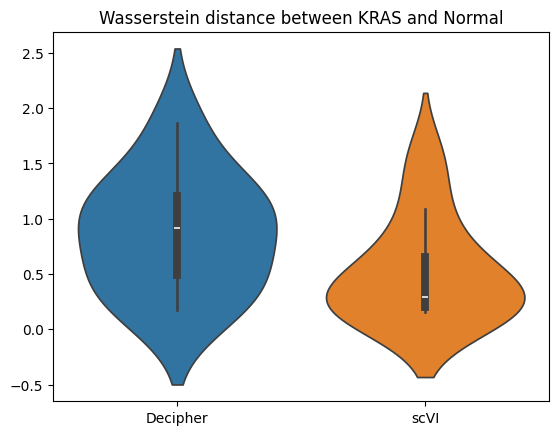

In [237]:
sns.violinplot(plot)
plt.title("Wasserstein distance between KRAS and Normal")

Text(0.5, 1.0, 'T-statistics of latent components separating KRAS vs Normal')

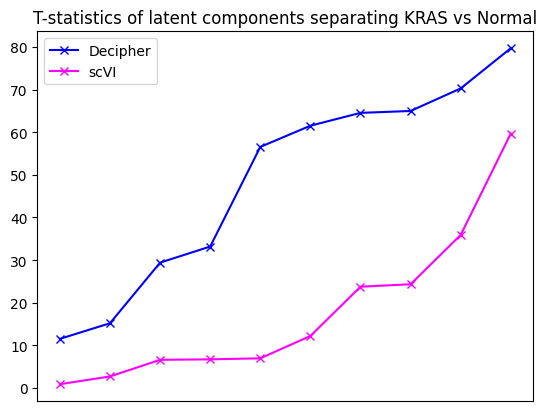

In [214]:
plt.plot(np.arange(0,10), np.sort(np.abs(t_tests.T.sort_values(by=0)[0])),label="Decipher", marker='x', c='blue')
plt.plot(np.arange(0,10), np.sort(np.abs(t_tests_scvi.T.sort_values(by=0)[0])),label="scVI", marker='x', c='magenta')
plt.legend()
plt.xticks([])
plt.title("T-statistics of latent components separating KRAS vs Normal")

In [255]:
kras = []
for i in adata.obs["Cluster"]:
    if i=='3':
        kras.append("KRAS")
    else:
        kras.append("normal")
adata.obs["mutation"] = kras

## Analyze genes associated with each latent component

In [ ]:
ad_normed = adata.to_df()
def get_cov(thing):
    covs = pd.DataFrame()
    for gene in ad_normed.columns:
        covs[gene] = [np.corrcoef([ad_normed[gene],thing])[0,1]]
    return covs.T
    
z_Cov = {}
for i in range(10):
    z_tmp = get_cov(z[:,i])
    z_Cov[i]=z_tmp

z_cov = pd.DataFrame()
for key in z_Cov.keys():
    z_cov[key] = z_Cov[key]

v_Cov = {}
for i in range(2):
    v_tmp = get_cov(v[:,i])
    v_Cov[i]=v_tmp

v_cov = pd.DataFrame()
for key in v_Cov.keys():
    v_cov[key] = v_Cov[key]

z_cov.columns = ["Z"+str(i) for i in z_cov.columns]
#v_cov.columns = ["V"+str(i) for i in v_cov.columns]

In [327]:
z4_low = pd.DataFrame(z_cov["Z4"]).sort_values(by="Z4",ascending=True).iloc[0:50].index
z3_high = pd.DataFrame(z_cov["Z3"]).sort_values(by="Z3",ascending=False).iloc[0:50].index
z6_low = pd.DataFrame(z_cov["Z6"]).sort_values(by="Z6",ascending=True).iloc[0:50].index
z7_high = pd.DataFrame(z_cov["Z7"]).sort_values(by="Z7",ascending=False).iloc[0:50].index

In [309]:
z4_low
#acinar/regeneration genes are going down over the trajectory

Index(['CLPS', 'CELA3B', 'TFF2', 'REG3A', 'PDIA2', 'TRY4', 'REG2', 'CTRL',
       'CEL', 'CTRB1', 'RNASE1', 'CPB1', 'ZG16', 'DMBT1', 'REG3D', 'FKBP11',
       'SERPINI2', 'PLA2G1B', 'PSMB10', 'CELA1', 'REG1', 'CPA2', 'CUZD1',
       'AQP12', 'SYCN', 'CELA2A', '2210010C04RIK', 'TMED6', 'PNLIPRP1',
       'GM5771', 'LRG1', 'REG3B', 'PNLIP', 'PRSS3', 'DERL3', 'P4HB', 'GM10334',
       'COPZ2', 'KLK1', 'C4B', 'REG3G', 'ERP27', 'GP2', 'AMY2A5', 'GNMT',
       'GHRL', 'HAMP2', 'AGR2', 'SLC39A5', 'PNLIPRP2'],
      dtype='object')

In [328]:
z6_low
#GKN3 is a gastric gene (look for others)
#S100A6 cancer associated (google for more)
#Fos/JUN are interesting 
# --> AP1 factors

Index(['JUN', 'JUNB', 'RBM39', 'SPP1', 'FOS', 'CTSL', 'MIA', 'IER2', 'GKN3',
       'SON', 'KLF6', 'HSPA5', 'BTG2', 'RHOB', 'UBC', 'CTSE', 'RBP4', 'LMO4',
       'GHRL', 'EGR1', 'IGFBP7', 'H3F3B', 'GALNT7', 'SFN', 'ZFP36', 'CYR61',
       'SOX9', 'ACTB', 'ZFP36L1', 'SERPINB1A', 'ALCAM', 'SDC1', 'CTNNB1',
       '1810011O10RIK', 'EPCAM', 'S100A6', 'ERRFI1', 'TXNIP', 'HES1', 'GLS2',
       'RGS2', 'FOSB', 'DUSP6', 'CALR', 'SPINT2', 'PFN1', 'JUND', 'GM10334',
       'ANXA4', 'IER3'],
      dtype='object')

In [334]:
z6_df = pd.DataFrame(z_cov["Z6"]).sort_values(by="Z6",ascending=True)
z6_df["rank"]=[i for i in range(z6_df.shape[0])]
z6_df.loc[["DUSP4","DUSP6","SPRY2","GKN3","CDKN2B"]]

,Z6,rank
DUSP4,-0.312125,694
DUSP6,-0.551601,42
SPRY2,-0.269360,1176
GKN3,-0.646049,8
CDKN2B,-0.487196,94


In [372]:
z6_df = z6_df.dropna()
scipy.stats.ranksums(z6_df.loc[["DUSP4","DUSP6","SPRY2","SPRY4"]]["Z6"],z6_df["Z6"])

RanksumsResult(statistic=-2.741998778990072, pvalue=0.006106656860875009)

In [300]:
z3_high
#CDK4, BAX --> P53/proliferation
#look at p53 targets
#stress related

Index(['EEF1A1', 'FTL1', 'NPM1', 'HSP90AB1', 'EIF1', 'PTMA', 'PPIA', 'HSPA8',
       'NACA', 'BTF3', 'KRT18', 'TUBB5', 'TMSB10', 'EIF3H', 'MYL12B', 'FAU',
       'ACTG1', 'B2M', 'H3F3A', 'HNRNPA1', 'MYL12A', 'HMGN1', 'PSMD8', 'SNRPE',
       'S100A10', 'RACK1', 'CLIC1', 'PRDX2', 'TBCA', 'RAN', 'SERBP1', 'YBX1',
       'CDK4', 'CCT4', 'CHCHD2', 'EIF3E', 'COX7C', 'KRT8', 'CLDN3', 'BAX',
       'GM11808', 'TMEM176B', 'COX7A2L', 'STMN1', 'SLC25A3', 'EIF3F', 'EEF2',
       'H2AFZ', 'NDUFC2', 'HN1'],
      dtype='object')

In [367]:
z7_high

Index(['HSP90AA1', 'KRT8', 'HSP90AB1', 'ACTG1', 'KRT18', 'DDX5', 'PTMA',
       'TNFRSF12A', 'EEF1A1', 'ACTB', 'HSPA8', 'ACTN1', 'EIF4A1', 'PTP4A1',
       'MYL12A', 'JUND', 'EIF5', 'RTN4', 'EIF1', 'CLDN4', 'H3F3B', 'DSTN',
       'UBB', 'SERBP1', 'HMGN1', 'NCL', 'S100A10', 'H3F3A', 'TUBB5', 'HNRNPA1',
       'PABPC1', 'TMSB10', 'IFRD1', 'TPM1', 'NPM1', 'CD24A', 'PPIA', 'CLDN3',
       'UBC', 'EIF3C', 'SOX4', 'CFL1', 'TMSB4X', 'HNRNPK', 'TES', 'EIF2S2',
       'TGIF1', 'STMN1', 'CLIC1', 'S100A11'],
      dtype='object')

In [97]:
import scipy
corrs = np.zeros((v.shape[1],z.shape[1]))
for i in range(v.shape[1]):
    for j in range(z.shape[1]):
        corrs[i][j]=np.abs(scipy.stats.spearmanr(v[:,i],z[:,j])[0])

In [98]:
z_corrs = np.zeros((z.shape[1],z.shape[1]))
for i in range(z.shape[1]):
    for j in range(z.shape[1]):
        z_corrs[i][j]=np.abs(scipy.stats.spearmanr(z[:,i],z[:,j])[0])

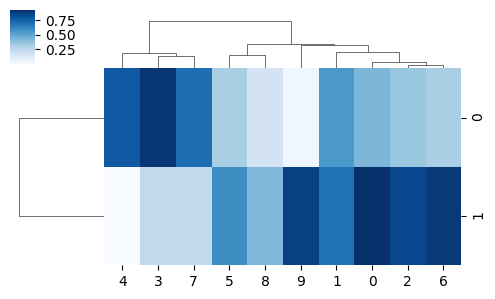

In [178]:
sns.clustermap(pd.DataFrame(corrs, index=[0,1],columns=np.arange(0,10)), cmap='Blues', figsize=(5,3))
plt.savefig("PDAC_cassandra/figures/vz.pdf")

## Analyze relationship between latent components and Kras signature

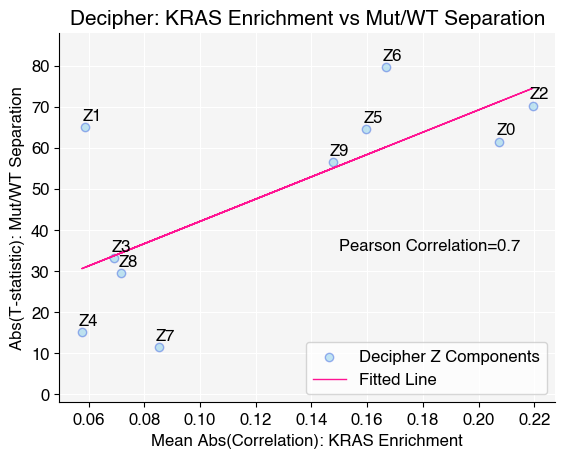

In [383]:
# Fit a line (degree 1 polynomial) to the data
from scipy.stats import pearsonr

x = abs(z_cov.loc[np.intersect1d(kras_sig, adata.var_names)].dropna()).mean(axis=0)
y = abs(t_tests.T[0])
labels = z_cov.columns
coefficients = np.polyfit(x, y, 1)

pearson_corr, _ = pearsonr(x, y)

# Get the slope and intercept of the fitted line
slope, intercept = coefficients

# Create the line of best fit
y_fit = slope * x + intercept

fig, ax = plt.subplots()
ax.scatter(x, y, label="Decipher Z Components", c='skyblue', alpha=.5, edgecolors="royalblue")
ax.plot(x, y_fit, color="deeppink", label="Fitted Line", linewidth=1, linestyle="-")


# Annotate each point
for i, label in enumerate(labels):
    ax.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(5,5), ha='center')
ax.annotate("Pearson Correlation="+str(round(pearson_corr,2)), (.15,35), fontsize=12)

ax.set_ylim([-2,88])
ax.set_axisbelow(True)
ax.set_facecolor('whitesmoke')
plt.grid(True, color='white')
plt.legend(loc='lower right')
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title("Decipher: KRAS Enrichment vs Mut/WT Separation", fontsize=15)
plt.xlabel("Mean Abs(Correlation): KRAS Enrichment",fontsize=12)
plt.ylabel("Abs(T-statistic): Mut/WT Separation",fontsize=12)
plt.savefig("decipher_sep_vs_kras.pdf")

In [121]:
scvi_normed = test.to_df()
    
z_Cov_scvi = {}
for i in range(10):
    z_tmp = get_cov(np.asarray(z_df_scvi)[:,i])
    z_Cov_scvi[i]=z_tmp

z_cov_scvi = pd.DataFrame()
for key in z_Cov.keys():
    z_cov_scvi[key] = z_Cov_scvi[key]

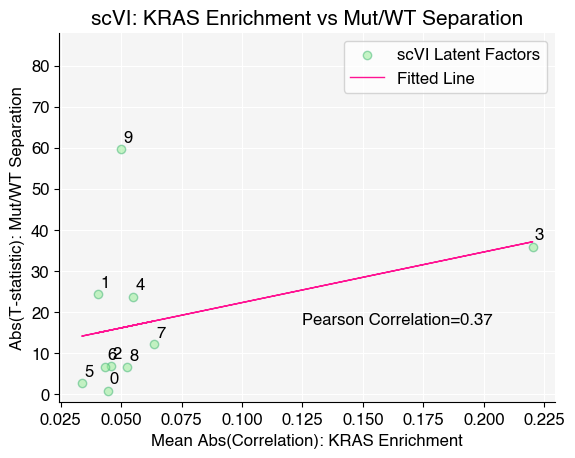

In [382]:
plt.rc('font', family='Helvetica')

# Fit a line (degree 1 polynomial) to the data
from scipy.stats import pearsonr

x = abs(z_cov_scvi.loc[np.intersect1d(kras_sig, adata.var_names)].dropna()).mean(axis=0)
y = abs(t_tests_scvi.T[0])
labels = z_cov_scvi.columns
coefficients = np.polyfit(x, y, 1)

pearson_corr, _ = pearsonr(x, y)

# Get the slope and intercept of the fitted line
slope, intercept = coefficients

# Create the line of best fit
y_fit = slope * x + intercept

fig, ax = plt.subplots()
# Plot the data points and the fitted line
ax.scatter(x, y, label="scVI Latent Factors", c='lightgreen', alpha=.5, edgecolors="mediumseagreen")
ax.plot(x, y_fit, color="deeppink", label="Fitted Line", linewidth=1, linestyle="-")


# Annotate each point
for i, label in enumerate(labels):
    ax.annotate(label, (x[i], y[i]), textcoords="offset points", xytext=(5,5), ha='center')
ax.annotate("Pearson Correlation="+str(round(pearson_corr,2)), (.125,17), fontsize=12)

ax.set_ylim([-2, 88])
ax.set_axisbelow(True)
ax.set_facecolor('whitesmoke')
plt.grid(True, color='white')
plt.legend()
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
plt.title("scVI: KRAS Enrichment vs Mut/WT Separation", fontsize=15)
plt.xlabel("Mean Abs(Correlation): KRAS Enrichment",fontsize=12)
plt.ylabel("Abs(T-statistic): Mut/WT Separation",fontsize=12)
plt.savefig("scVI_sep_vs_kras.pdf")